# 4.1  "Create 3 clusters as below.

1. Sensitive Area's

2. Moderate Area's

3. Peaceful Area's"

In [57]:
import pandas as pd
import seaborn as sns
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Removing warnings
import warnings
warnings.filterwarnings('ignore')

# Load the dataset
df = pd.read_csv(r'E:\DS Course Related\Capstone Project\phase4.csv')
df.drop(columns=df.columns[0:2],axis=1,inplace=True)
df

,State/UT,Population,Area (km2),2001,2011,Per month increase in literacy,literacy in 2002,literacy in 2003,literacy in 2004,literacy in 2005,...,Policemen_Chargesheeted,Policemen_Convicted,Rape_y.1,Kidnapping and Abduction,Dowry Deaths,Assault on women with intent to outrage her modesty,Insult to modesty of Women,Cruelty by Husband or his Relatives,Importation of Girls,Total_crimes
0,A&N ISLANDS,380581.0,8249.0,81.30,86.27,0.414167,81.714167,82.128333,82.5425,82.956667,...,0.0,0.0,24.0,14.0,2.0,31.0,10.0,26.0,0.0,2982.0
1,ANDHRA PRADESH,49577103.0,162975.0,60.47,67.66,0.599167,61.069167,61.668333,62.2675,62.866667,...,29.0,2.0,1442.0,1612.0,613.0,5147.0,4562.0,13389.0,7.0,515853.0
2,ARUNACHAL PRADESH,1383727.0,83743.0,54.34,66.95,1.050833,55.390833,56.441667,57.4925,58.543333,...,6.0,0.0,59.0,60.0,1.0,84.0,6.0,26.0,0.0,8339.0
3,ASSAM,31205576.0,78438.0,63.25,73.45,0.850000,64.100000,64.950000,65.8000,66.650000,...,2.0,0.0,1721.0,3360.0,175.0,1840.0,20.0,6407.0,3.0,210809.0
4,BIHAR,104099452.0,94163.0,47.00,61.82,1.235000,48.235000,49.470000,50.7050,51.940000,...,5.0,4.0,1555.0,3789.0,1413.0,999.0,53.0,3686.0,83.0,399281.0
5,CHANDIGARH,1055450.0,0.0,81.94,86.43,0.374167,82.314167,82.688333,83.0625,83.436667,...,0.0,0.0,33.0,66.0,10.0,45.0,28.0,112.0,0.0,14785.0
6,CHHATTISGARH,25545198.0,135191.0,64.66,71.04,0.531667,65.191667,65.723333,66.2550,66.786667,...,67.0,54.0,1053.0,365.0,128.0,1763.0,182.0,980.0,2.0,153886.0
7,DADRA AND NAGAR HAVELI,585764.0,603.0,57.63,77.65,1.668333,59.298333,60.966667,62.6350,64.303333,...,0.0,0.0,14.0,28.0,2.0,22.0,4.0,10.0,0.0,3134.0
8,DAMAN AND DIU,0.0,0.0,78.18,87.07,0.740833,78.920833,79.661667,80.4025,81.143333,...,0.0,0.0,5.0,3.0,1.0,4.0,1.0,5.0,0.0,1023.0
9,DELHI,16787941.0,1484.0,81.67,86.34,0.389167,82.059167,82.448333,82.8375,83.226667,...,7.0,0.0,706.0,2160.0,143.0,868.0,225.0,1985.0,1.0,205547.0


In [58]:
# Select the features to use for clustering
features = df.columns[16:-1]

# Standardize the features
scaler = StandardScaler()
X = scaler.fit_transform(df[features])

# Perform clustering using K-Means
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(X)

# Add the cluster labels to the dataset
df['cluster'] = kmeans.labels_

# Define the names for the clusters
cluster_names = {
    2: 'Sensitive Area',
    1: 'Moderate Area',
    0: 'Peaceful Area'
}

# Map the cluster labels to cluster names
df['cluster_name'] = df['cluster'].map(cluster_names)

# Save the results to a new file
df.to_csv('crimes_clusters.csv', index=False)


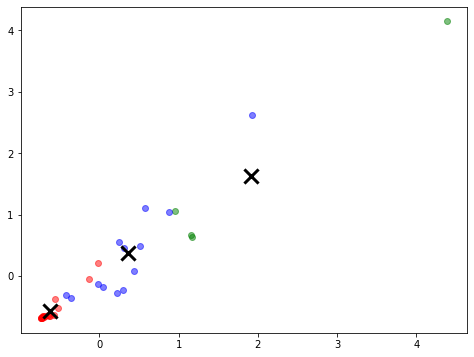

In [59]:
# Get cluster labels and centroids
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

# Visualize the clusters
fig, ax = plt.subplots(figsize=(8, 6))

colors = ['red', 'green', 'blue']

for i in range(len(X)):
    ax.scatter(X[i, 0], X[i, 1], c=colors[labels[i]], alpha=0.5)

ax.scatter(centroids[:, 0], centroids[:, 1], marker='x', s=200, linewidths=3, color='black')

plt.show()

In [60]:
df[['State/UT','cluster_name']].sort_values(by='cluster_name')

,State/UT,cluster_name
1,ANDHRA PRADESH,Moderate Area
34,UTTAR PRADESH,Moderate Area
21,MAHARASHTRA,Moderate Area
20,MADHYA PRADESH,Moderate Area
0,A&N ISLANDS,Peaceful Area
33,TRIPURA,Peaceful Area
32,TELANGANA,Peaceful Area
30,SIKKIM,Peaceful Area
28,PUNJAB,Peaceful Area
27,PUDUCHERRY,Peaceful Area


In [61]:
df['cluster_name'].value_counts()

Peaceful Area     20
Sensitive Area    13
Moderate Area      4
Name: cluster_name, dtype: int64

In [62]:
# Filter the rows with 'Peaceful Area' in the 'cluster_name' column
Peaceful_Area = df.loc[df['cluster_name'] == 'Peaceful Area', 'State/UT'].tolist()

# Print the list of moderate areas
print(Peaceful_Area)

['A&N ISLANDS', 'ARUNACHAL PRADESH', 'CHANDIGARH', 'DADRA AND NAGAR HAVELI', 'DAMAN AND DIU', 'GOA', 'HIMACHAL PRADESH', 'JAMMU AND KASHMIR', 'LADAKH', 'LAKSHADWEEP', 'MANIPUR', 'MEGHALAYA', 'MIZORAM', 'NAGALAND', 'PUDUCHERRY', 'PUNJAB', 'SIKKIM', 'TELANGANA', 'TRIPURA', 'UTTARAKHAND']


In [63]:
# Filter the rows with 'Moderate Area' in the 'cluster_name' column
moderate_areas = df.loc[df['cluster_name'] == 'Moderate Area', 'State/UT'].tolist()

# Print the list of moderate_areas
print(moderate_areas)

['ANDHRA PRADESH', 'MADHYA PRADESH', 'MAHARASHTRA', 'UTTAR PRADESH']


In [64]:
# Filter the rows with 'Sensitive Area' in the 'cluster_name' column
Sensitive_Area = df.loc[df['cluster_name'] == 'Sensitive Area', 'State/UT'].tolist()

# Print the list of Sensitive_Area
print(Sensitive_Area)

['ASSAM', 'BIHAR', 'CHHATTISGARH', 'DELHI', 'GUJARAT', 'HARYANA', 'JHARKHAND', 'KARNATAKA', 'KERALA', 'ODISHA', 'RAJASTHAN', 'TAMIL NADU', 'WEST BENGAL']


# 4.2  Create DataFrame for each cluster that shows data according to the areas.

In [65]:
# Filter the original DataFrame based on the cluster names
sensitive_area_df = df[df['cluster_name'] == 'Sensitive Area']
moderate_area_df = df[df['cluster_name'] == 'Moderate Area']
peaceful_area_df = df[df['cluster_name'] == 'Peaceful Area']

# Print the number of rows in each DataFrame
print(f"Sensitive Area DataFrame shape: {sensitive_area_df.shape}")
print(f"Moderate Area DataFrame shape: {moderate_area_df.shape}")
print(f"Peaceful Area DataFrame shape: {peaceful_area_df.shape}")


Sensitive Area DataFrame shape: (13, 150)
Moderate Area DataFrame shape: (4, 150)
Peaceful Area DataFrame shape: (20, 150)


In [66]:
sensitive_area_df[['State/UT','Population','Area (km2)','2011','Total_crimes','cluster_name']].reset_index(drop=True).sort_values(by='Total_crimes',ascending=False)

,State/UT,Population,Area (km2),2011,Total_crimes,cluster_name
11,TAMIL NADU,72147030.0,130058.0,80.33,494098.0,Sensitive Area
10,RAJASTHAN,68548437.0,342239.0,67.06,477129.0,Sensitive Area
12,WEST BENGAL,91276115.0,88752.0,77.08,421566.0,Sensitive Area
1,BIHAR,104099452.0,94163.0,61.82,399281.0,Sensitive Area
8,KERALA,33406061.0,38863.0,93.91,388068.0,Sensitive Area
7,KARNATAKA,61095297.0,191792.0,75.60,364521.0,Sensitive Area
4,GUJARAT,60439692.0,196024.0,79.31,353387.0,Sensitive Area
0,ASSAM,31205576.0,78438.0,73.45,210809.0,Sensitive Area
3,DELHI,16787941.0,1484.0,86.34,205547.0,Sensitive Area
5,HARYANA,25351462.0,44212.0,76.64,189336.0,Sensitive Area


In [67]:
moderate_area_df[['State/UT','Population','Area (km2)','2011','Total_crimes','cluster_name']].reset_index(drop=True).sort_values(by='Total_crimes',ascending=False)

,State/UT,Population,Area (km2),2011,Total_crimes,cluster_name
2,MAHARASHTRA,112374333.0,307713.0,82.34,608358.0,Moderate Area
3,UTTAR PRADESH,199812341.0,240928.0,69.72,589289.0,Moderate Area
1,MADHYA PRADESH,72626809.0,308245.0,70.63,587540.0,Moderate Area
0,ANDHRA PRADESH,49577103.0,162975.0,67.66,515853.0,Moderate Area


In [68]:
peaceful_area_df[['State/UT','Population','Area (km2)','2011','Total_crimes','cluster_name']].reset_index(drop=True).sort_values(by='Total_crimes',ascending=False)

,State/UT,Population,Area (km2),2011,Total_crimes,cluster_name
15,PUNJAB,27743338.0,50362.0,76.68,100452.0,Peaceful Area
7,JAMMU AND KASHMIR,12267032.0,42241.0,68.74,73821.0,Peaceful Area
6,HIMACHAL PRADESH,6864602.0,55673.0,83.78,36007.0,Peaceful Area
19,UTTARAKHAND,10086292.0,53483.0,79.63,30264.0,Peaceful Area
18,TRIPURA,3673917.0,10486.0,87.75,18586.0,Peaceful Area
2,CHANDIGARH,1055450.0,0.0,86.43,14785.0,Peaceful Area
12,MIZORAM,1097206.0,21081.0,91.58,13746.0,Peaceful Area
14,PUDUCHERRY,1247953.0,479.0,86.55,13136.0,Peaceful Area
10,MANIPUR,2570390.0,22327.0,79.85,11391.0,Peaceful Area
5,GOA,1458545.0,3702.0,87.40,11191.0,Peaceful Area


# 4.3  "Analyse your clusters and prepare a report that explains all your observations.

Example - 

1. What is impacting more crimes in sensitive areas. 

2. What needs to be done to reduce crime. 

3. Most safe and unsafe districts.

4. Etc.......Anything that you observe (If you want, you can plot various graphs to analyze)"

In [69]:
sensitive_area_df = df[df['cluster_name'] == 'Sensitive Area']

sensitive_area_df.drop(columns=['TOTAL - Dacoity','TOTAL - Robbery','TOTAL - Burglary','TOTAL - Theft','TOTAL IPC CRIMES','Total for boys all Age Groups','Total for girls all Age Groups','Grand total','2001','2011','Per month increase in literacy','literacy in 2002',
'literacy in 2003','literacy in 2004','literacy in 2005',
'literacy in 2006','literacy in 2007',
'literacy in 2008','literacy in 2009',
'literacy in 2010','literacy in 2012',
'Total_crimes','cluster','Rape_y.1'],axis=1,inplace=True)

# sensitive_area_df

In [70]:
pd.options.display.float_format = '{:.2f}'.format # this sets the float format to display 2 decimal places

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

sensitive_area_df.describe().T.sort_values(by='max',ascending=False)

,count,mean,std,min,25%,50%,75%,max
Value_of_Property_Stolen,13.00,2600527470.77,2431348628.37,472956236.00,547924668.00,1475572408.00,2812836460.00,7785717012.00
Value_of_Property_Recovered,13.00,486205456.23,367568462.43,63504472.00,181939717.00,384303742.00,750221865.00,1168242161.00
Population,13.00,51143431.85,27342175.15,16787941.00,31205576.00,41974219.00,68548437.00,104099452.00
Area (km2),13.00,121279.92,88165.00,1484.00,78438.00,94163.00,155707.00,342239.00
OTHER IPC CRIMES,13.00,54373.92,35605.23,14843.00,25223.00,56508.00,70250.00,124176.00
HURT/GREVIOUS HURT,13.00,16745.15,12792.03,2011.00,6676.00,13760.00,23285.00,45827.00
Cases_Property_Stolen,13.00,21422.38,7318.21,10989.00,12945.00,23549.00,28118.00,30575.00
THEFT,13.00,15641.00,6843.13,5818.00,9394.00,17667.00,20715.00,23314.00
CRUELTY BY HUSBAND OR HIS RELATIVES,13.00,5461.08,5423.52,980.00,1985.00,3686.00,6407.00,19865.00
Cruelty by Husband or his Relatives,13.00,5461.08,5423.52,980.00,1985.00,3686.00,6407.00,19865.00


# Visualizing sensitive areas dataset

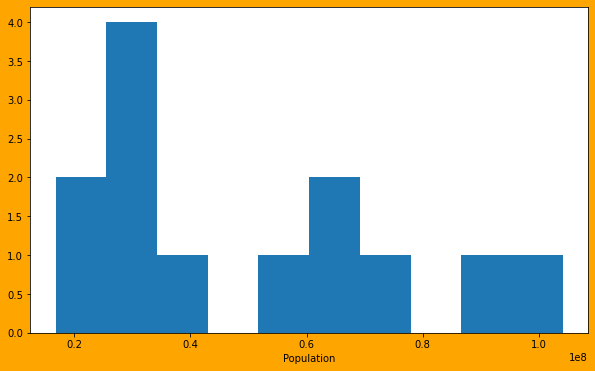

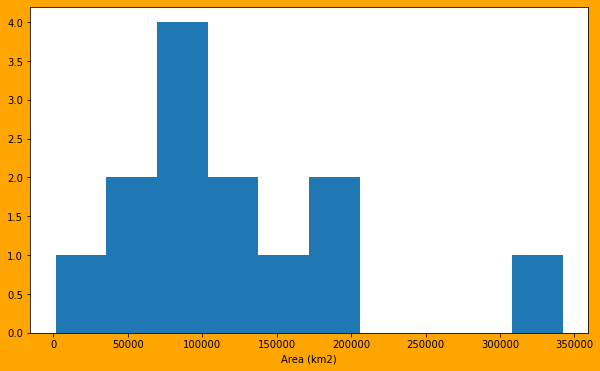

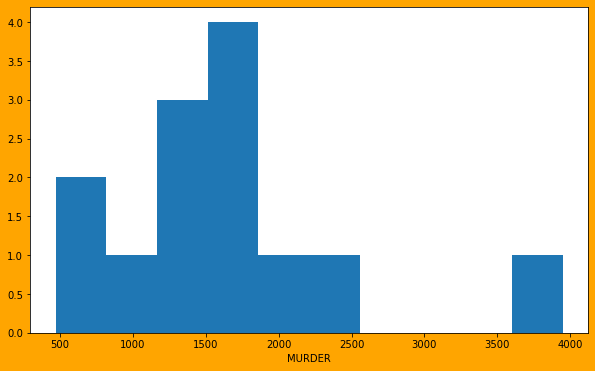

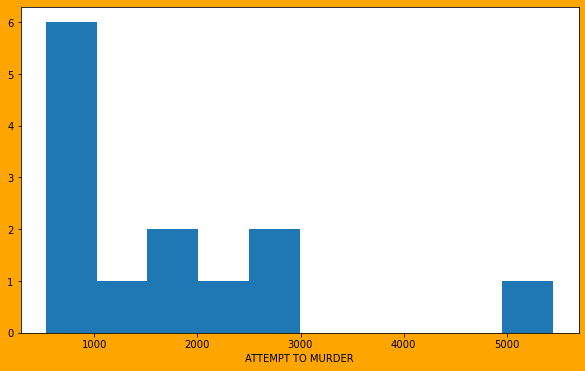

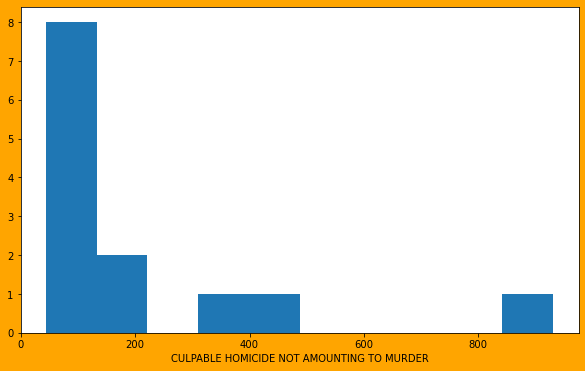

...

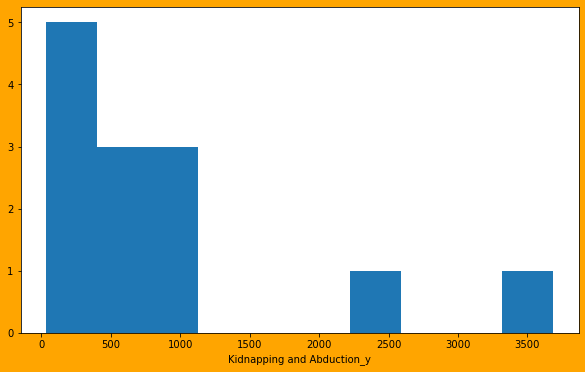

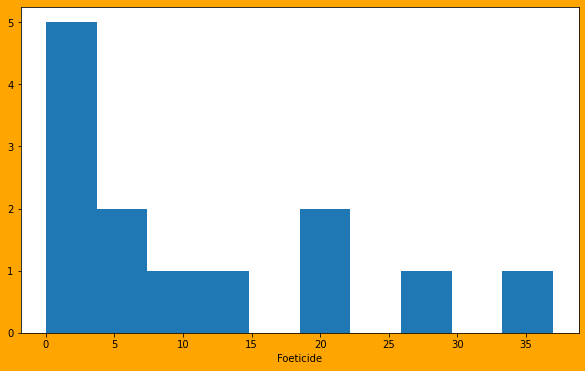

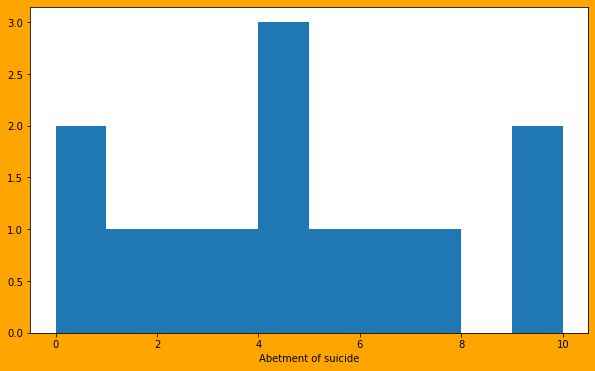

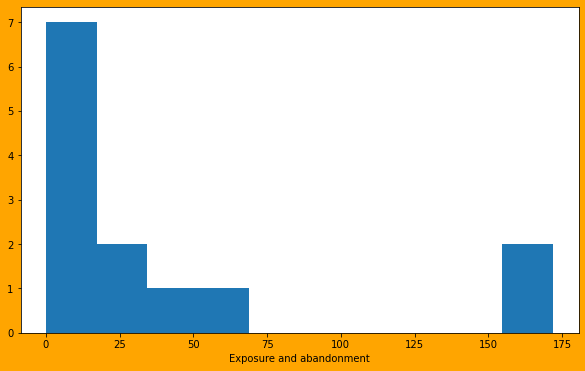

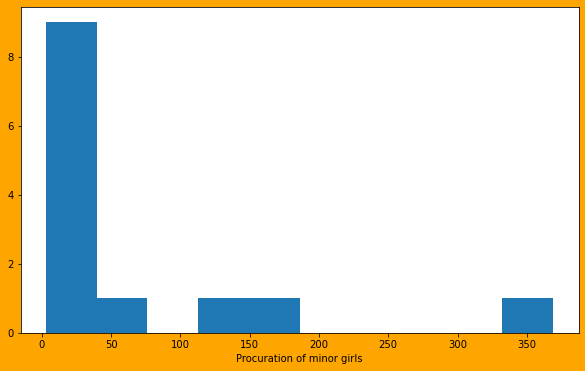

KeyboardInterrupt: 

<Figure size 720x432 with 0 Axes>

In [71]:
# Histogram plot:

for i in sensitive_area_df.columns[1:-1]:
    plt.figure(figsize=(10,6),facecolor='orange')
    plt.hist(sensitive_area_df[i],bins=10)
    plt.xlabel(i)
    plt.show()
    print('\n')

In [ ]:
# Densityplot

for i in sensitive_area_df.columns[1:-1]:
    plt.figure(figsize=(10,6),facecolor='orange')
    sns.distplot(sensitive_area_df[i])
    plt.xlabel(i)
    plt.show()

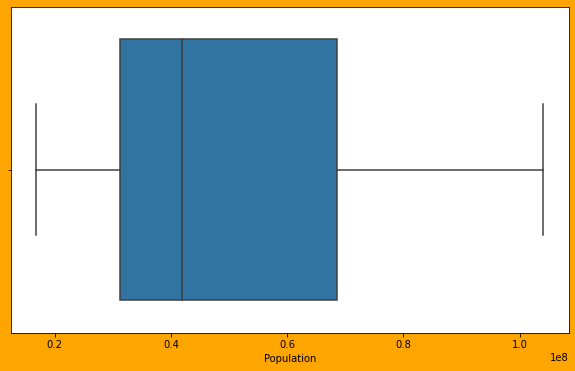

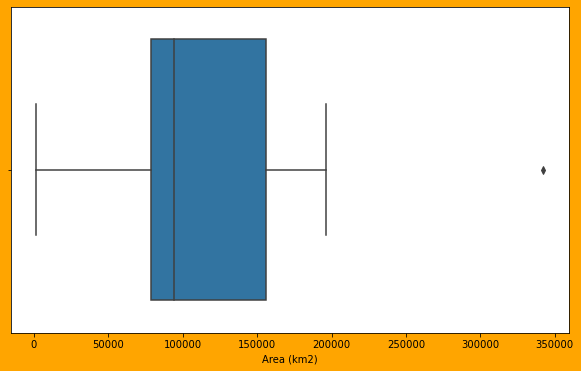

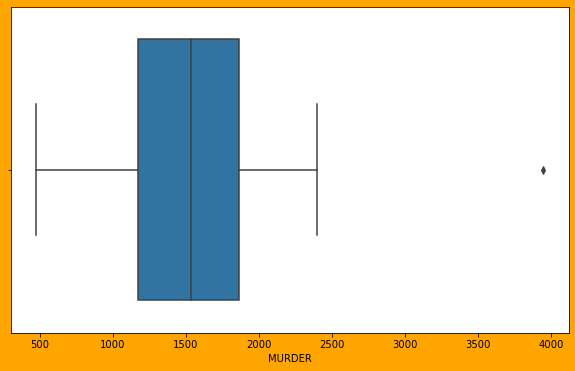

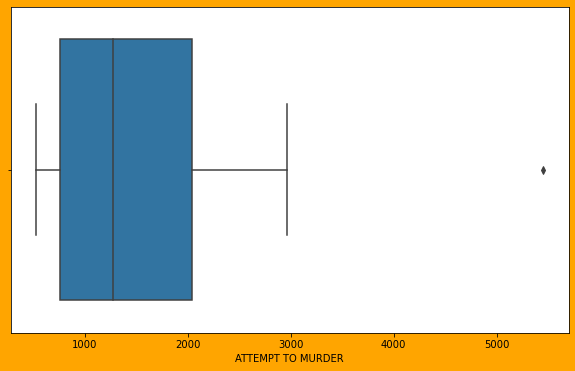

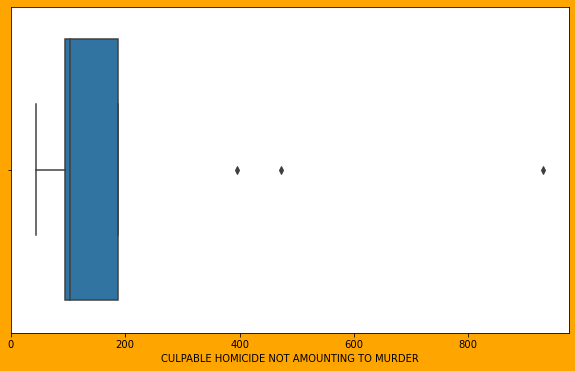

...

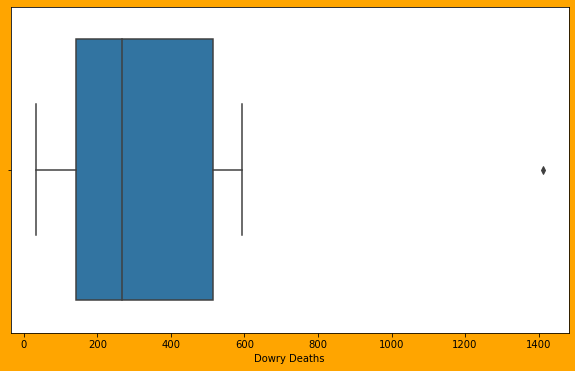

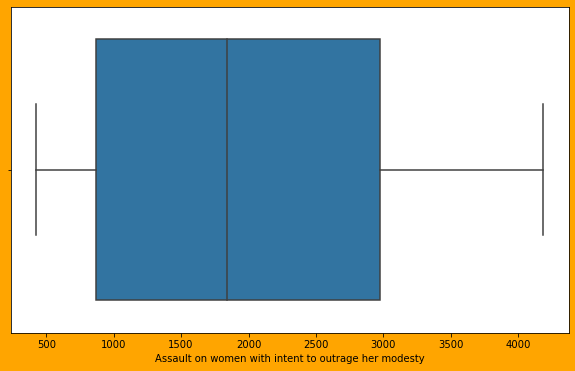

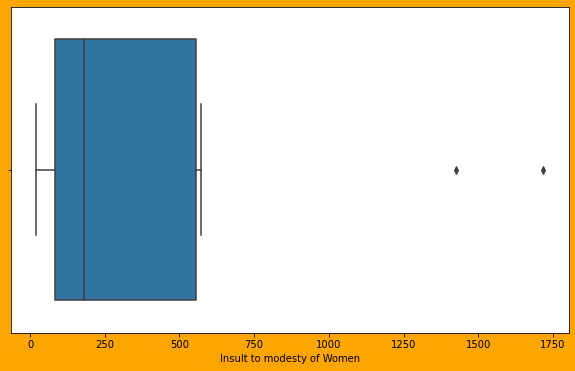

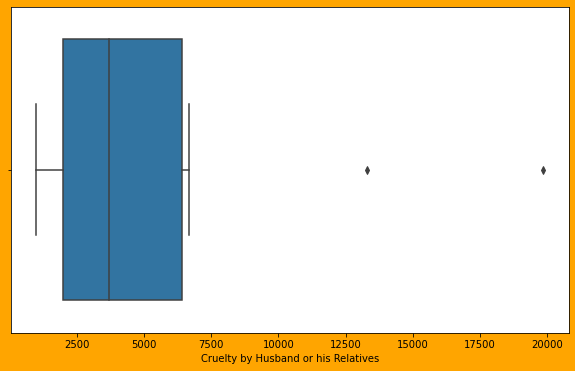

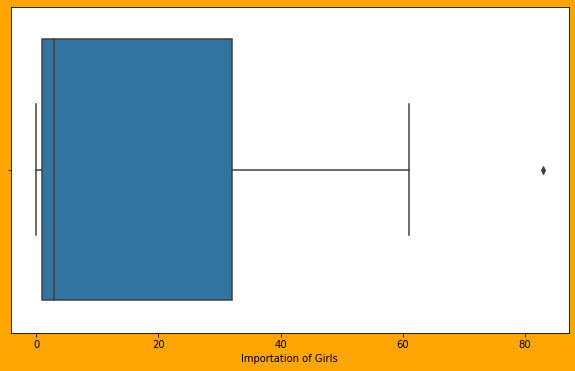

In [82]:
# Boxplots

for i in sensitive_area_df.columns[1:-1]:
    plt.figure(figsize=(10,6),facecolor='orange')
    sns.boxplot(sensitive_area_df[i])
    plt.xlabel(i)
    plt.show()

# Visualizing moderate areas dataset

In [19]:
moderate_area_df = df[df['cluster_name'] == 'Moderate Area']

moderate_area_df.drop(columns=['TOTAL - Dacoity','TOTAL - Robbery','TOTAL - Burglary','TOTAL - Theft','TOTAL IPC CRIMES','Total for boys all Age Groups','Total for girls all Age Groups','Grand total','2001','2011','Per month increase in literacy','literacy in 2002',
'literacy in 2003','literacy in 2004','literacy in 2005',
'literacy in 2006','literacy in 2007',
'literacy in 2008','literacy in 2009',
'literacy in 2010','literacy in 2012',
'Total_crimes','cluster','Rape_y.1'],axis=1,inplace=True)

moderate_area_df

,State/UT,Population,Area (km2),MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,KIDNAPPING AND ABDUCTION OF OTHERS,DACOITY,PREPARATION AND ASSEMBLY FOR DACOITY,ROBBERY,BURGLARY,THEFT,AUTO THEFT,OTHER THEFT,RIOTS,CRIMINAL BREACH OF TRUST,CHEATING,COUNTERFIETING,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,Murder_x,Rape_x,Kidnapping and Abduction_x,Dacoity_x,Robbery_x,Arson_x,Hurt_x,Prevention of atrocities (POA) Act_x,Protection of Civil Rights (PCR) Act_x,Other Crimes Against SCs,Murder_y,Rape_y,Kidnapping Abduction,Dacoity_y,Robbery_y,Arson_y,Hurt_y,Protection of Civil Rights (PCR) Act_y,Prevention of atrocities (POA) Act_y,Other Crimes Against STs,Murder,Rape_x.1,Kidnapping and Abduction_y,Foeticide,Abetment of suicide,Exposure and abandonment,Procuration of minor girls,Buying of girls for prostitution,Selling of girls for prostitution,Prohibition of child marriage act,Other Crimes,Total,Boys 7-12 Years,Girls 7-12 Years,Boys 12-16 Years,Girls 12-16 Years,Boys 16-18 Years,Girls 16-18 Years,Cases_Property_Recovered,Cases_Property_Stolen,Value_of_Property_Recovered,Value_of_Property_Stolen,Police_Injured_By_Criminals,Police_Injured_By_Riotous_Mobs,Police_Injured_In_Accidents,Police_Injured_In_Dacoity_OperationsOther_raids,Police_Injured_In_TerroristsExtremists_Operations,Police_Injured_On_Border_Duties,Police_Injured_Total_Policemen,Police_Killed_By_Criminals,Police_Killed_By_Riotous_Mobs,Police_Killed_In_Accidents,Police_Killed_In_Dacoity_OperationsOther_raids,Police_Killed_In_TerroristsExtremists_Operations,Police_Killed_On_Border_Duties,Police_Killed_Total_Policemen,RESIDENTIAL PREMISES - Dacoity,RESIDENTIAL PREMISES - Robbery,RESIDENTIAL PREMISES - Burglary,RESIDENTIAL PREMISES - Theft,HIGHWAYS - Dacoity,HIGHWAYS - Robbery,HIGHWAYS - Burglary,HIGHWAYS - Theft,RIVER and SEA - Dacoity,RIVER and SEA - Robbery,RIVER and SEA - Burglary,RIVER and SEA - Theft,RAILWAYS - Dacoity,RAILWAYS - Robbery,RAILWAYS - Burglary,RAILWAYS - Theft,BANKS - Dacoity,BANKS - Robbery,BANKS - Burglary,BANKS - Theft,COMMERCIAL ESTABLISHMENTS - Dacoity,COMMERCIAL ESTABLISHMENTS - Robbery,COMMERCIAL ESTABLISHMENTS - Burglary,COMMERCIAL ESTABLISHMENTS - Theft,OTHER PLACES - Dacoity,OTHER PLACES - Robbery,OTHER PLACES - Burglary,OTHER PLACES - Theft,Cases_Registered_under_Human_Rights_Violations,Policemen_Chargesheeted,Policemen_Convicted,Kidnapping and Abduction,Dowry Deaths,Assault on women with intent to outrage her modesty,Insult to modesty of Women,Cruelty by Husband or his Relatives,Importation of Girls,cluster_name
1,ANDHRA PRADESH,49577103.00,162975.00,2808.00,2229.00,171.00,1442.00,1.00,1442.00,2154.00,1612.00,701.00,250.00,27.00,794.00,9050.00,28267.00,8966.00,19439.00,3001.00,1271.00,11002.00,461.00,1176.00,56768.00,613.00,5147.00,4562.00,13389.00,7.00,14085.00,48087.00,64.00,131.00,28.00,3.00,15.00,20.00,722.00,1737.00,459.00,1874.00,16.00,60.00,10.00,0.00,1.00,4.00,134.00,39.00,326.00,425.00,119.00,646.00,781.00,7.00,21.00,99.00,106.00,9.00,11.00,29.00,633.00,2274.00,112.00,5.00,734.00,37.00,1216.00,129.00,19848.00,36407.00,725079668.00,1533054566.00,22.00,133.00,121.00,28.00,45.00,1.00,286.00,4.00,4.00,53.00,4.00,31.00,1.00,70.00,120.00,262.00,6504.00,9766.00,59.00,172.00,172.00,842.00,2.00,11.00,101.00,110.00,8.00,43.00,56.00,1685.00,2.00,4.00,38.00,99.00,14.00,32.00,1330.00,3445.00,77.00,331.00,1762.00,14693.00,45.00,29.00,2.00,1612.00,613.00,5147.00,4562.00,13389.00,7.00,Moderate Area
20,MADHYA PRADESH,72626809.00,308245.00,2511.00,2870.00,204.00,3425.00,1.00,3425.00,1302.00,1127.00,325.00,166.00,156.00,2270.00,13549.00,24583.00,12279.00,16438.00,3395.00,613.00,2021.00,54.00,1053.00,39193.00,892.00,7118.00,918.00,3988.00,45.00,7721

In [20]:
moderate_area_df.describe().T.sort_values(by='max',ascending=False)

,count,mean,std,min,25%,50%,75%,max
Value_of_Property_Stolen,4.00,8848800545.50,10425793326.03,1533054566.00,1748341618.25,5042946545.50,12143405472.75,23776254525.00
Value_of_Property_Recovered,4.00,2923676414.75,3106469746.49,725079668.00,1052609966.00,1749807314.00,3620873762.75,7470011363.00
Population,4.00,108597646.50,66110285.53,49577103.00,66864382.50,92500571.00,134233835.00,199812341.00
Area (km2),4.00,254965.25,68993.50,162975.00,221439.75,274320.50,307846.00,308245.00
OTHER IPC CRIMES,4.00,70357.50,30888.16,48087.00,49659.00,59379.00,80077.50,114585.00
Cases_Property_Stolen,4.00,48211.25,21667.06,36407.00,36635.00,37887.50,49463.75,80663.00
HURT/GREVIOUS HURT,4.00,35997.25,16387.64,17816.00,27113.00,34702.50,43586.75,56768.00
THEFT,4.00,35918.75,12864.44,24583.00,27346.00,32821.50,41394.25,53449.00
OTHER PLACES - Theft,4.00,18812.25,11754.33,11817.00,12249.75,13543.50,20106.00,36345.00
OTHER THEFT,4.00,23164.75,8724.24,16438.00,18688.75,20130.50,24606.50,35960.00


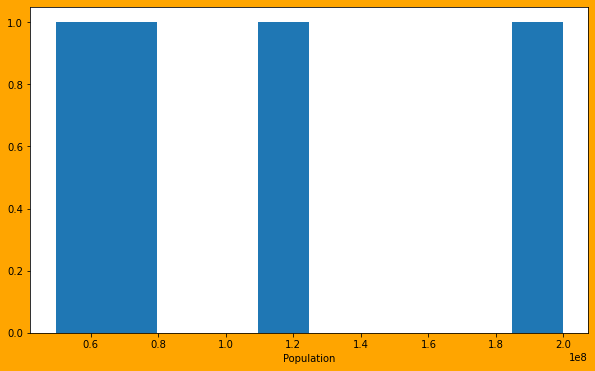

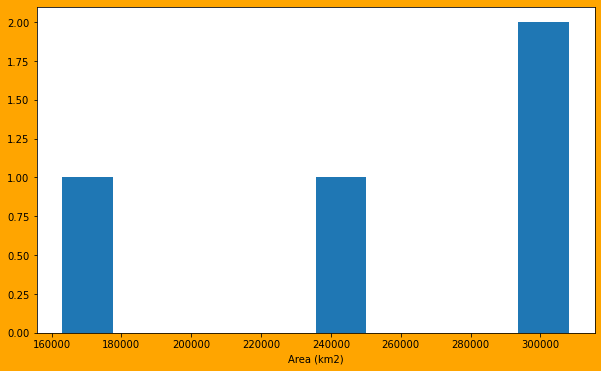

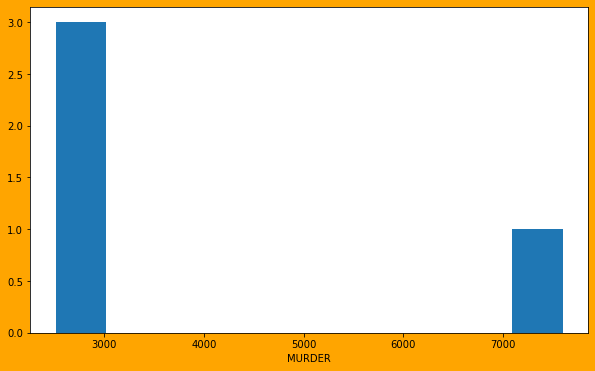

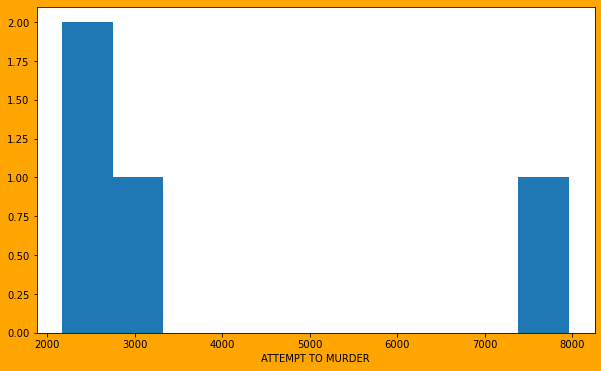

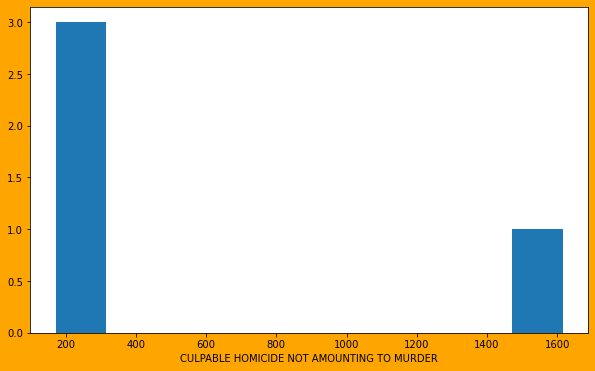

...

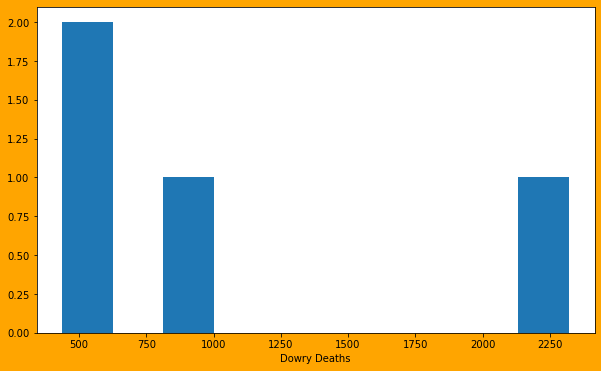

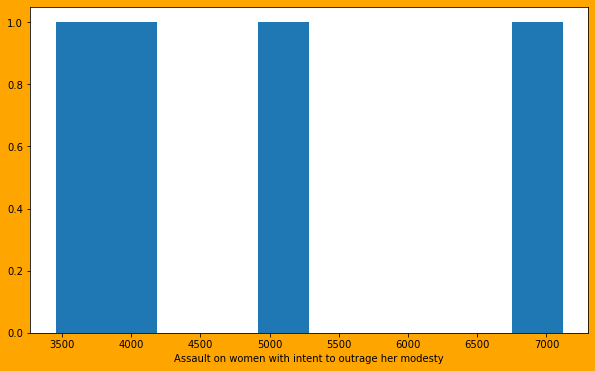

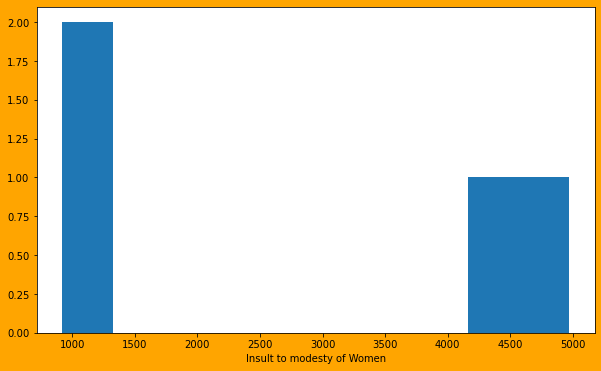

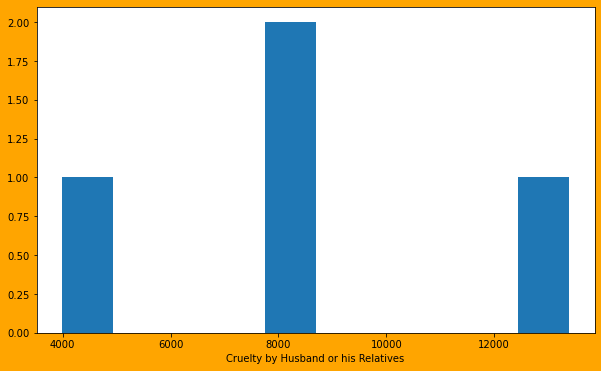

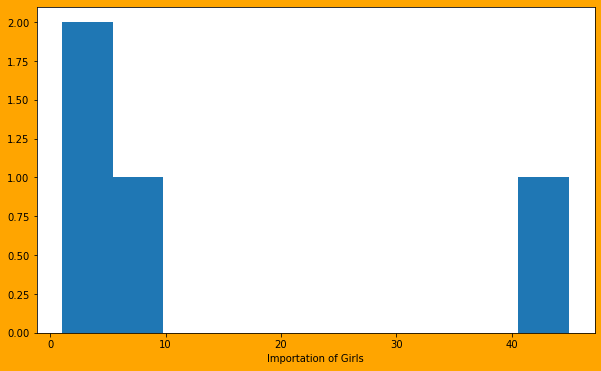

In [102]:
# Histogram plot:

for i in moderate_area_df.columns[1:-1]:
    plt.figure(figsize=(10,6),facecolor='orange')
    plt.hist(moderate_area_df[i],bins=10)
    plt.xlabel(i)
    plt.show()
    print('\n')

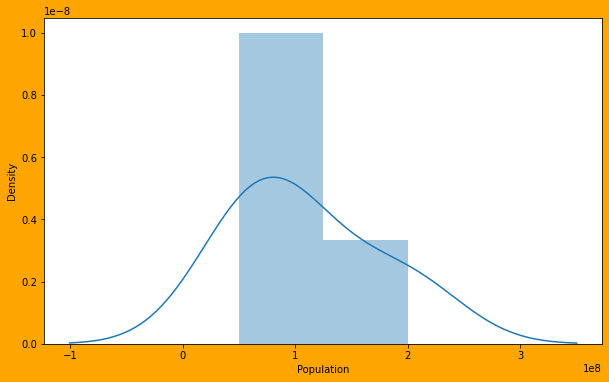

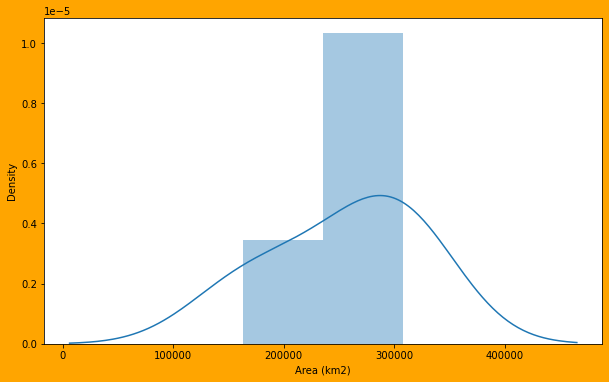

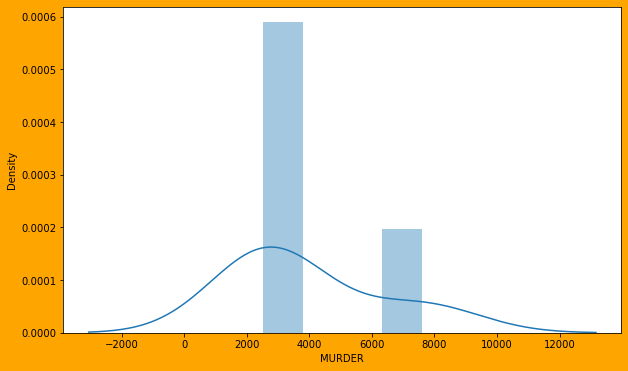

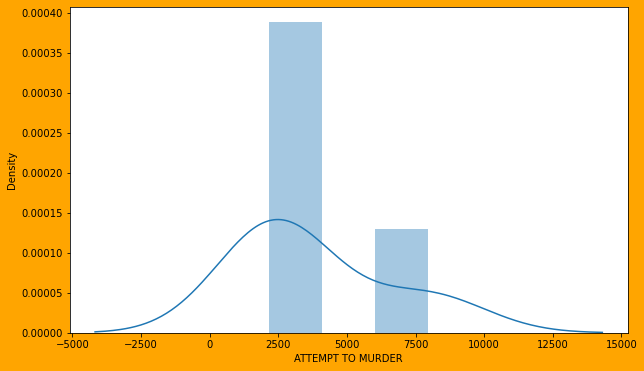

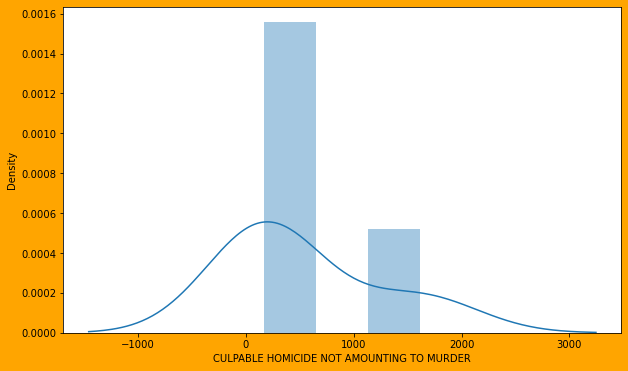

...

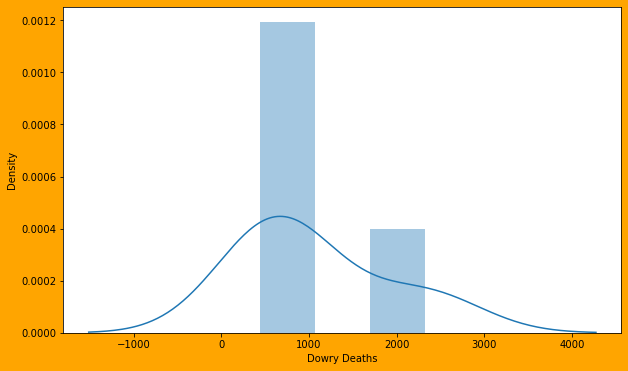

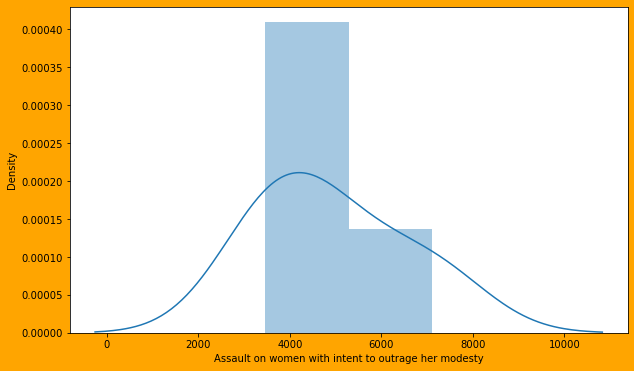

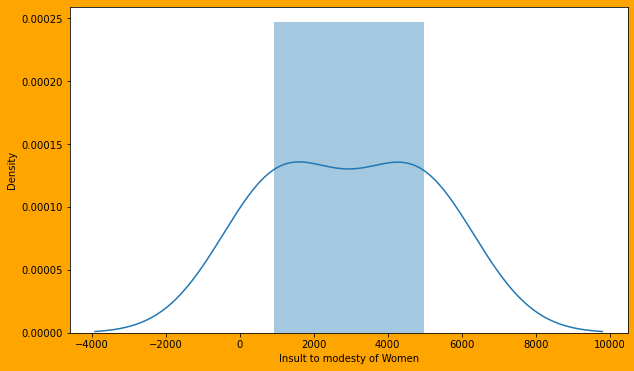

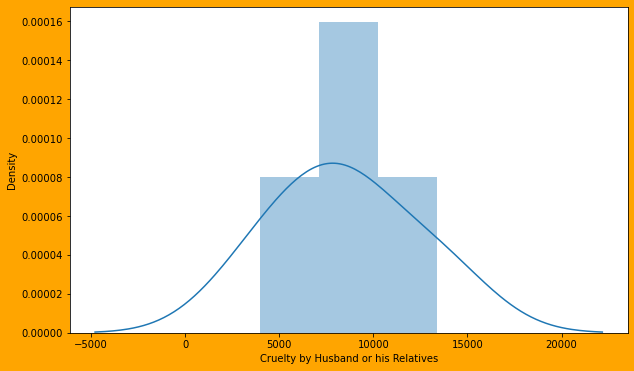

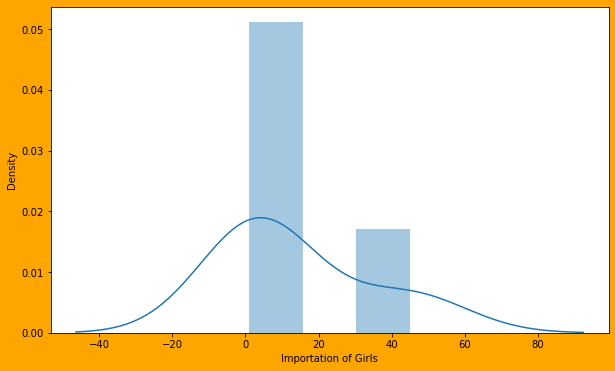

In [103]:
# Densityplot

for i in moderate_area_df.columns[1:-1]:
    plt.figure(figsize=(10,6),facecolor='orange')
    sns.distplot(moderate_area_df[i])
    plt.xlabel(i)
    plt.show()

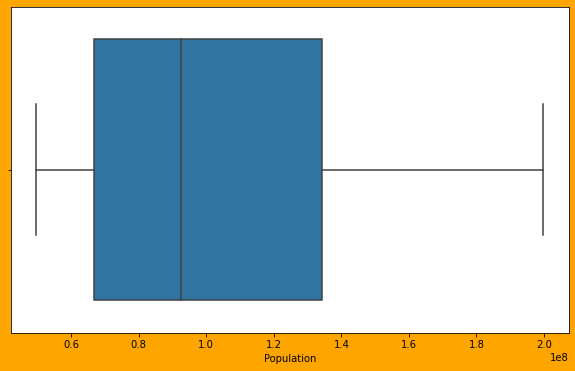

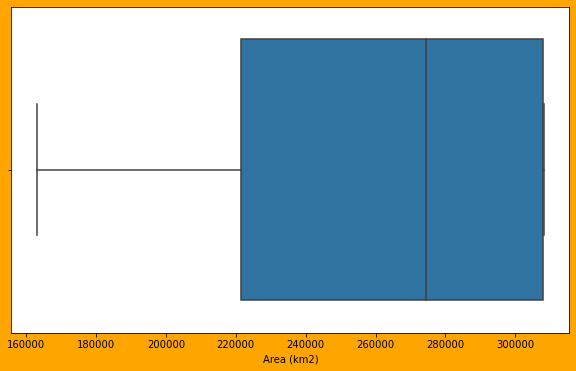

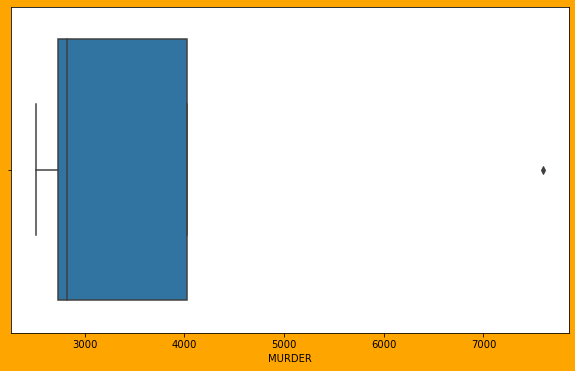

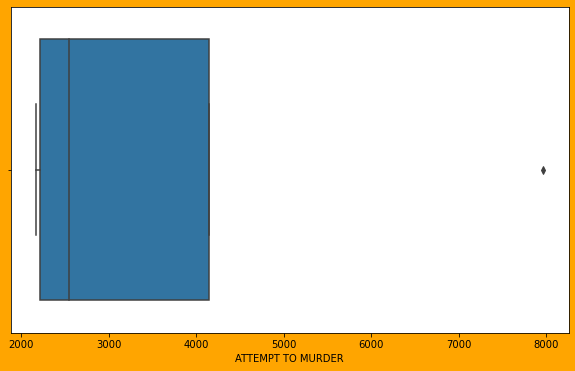

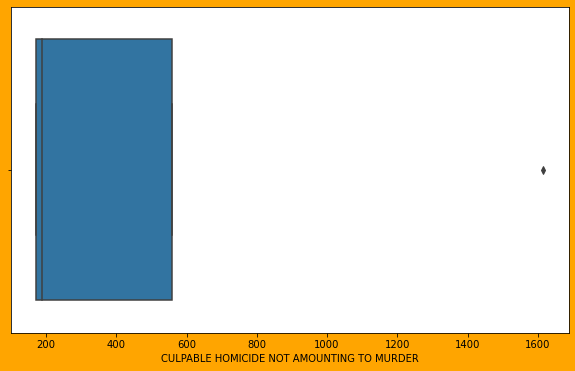

...

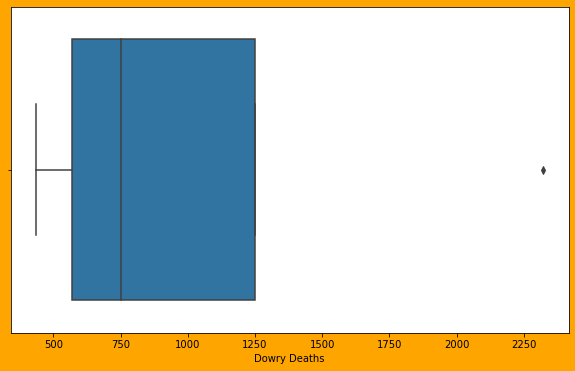

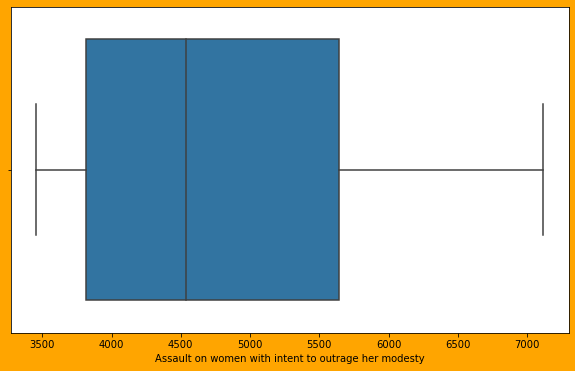

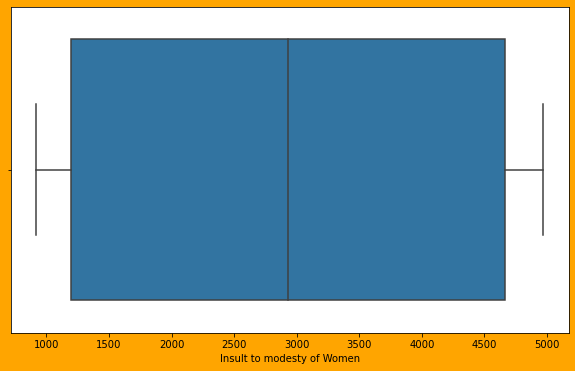

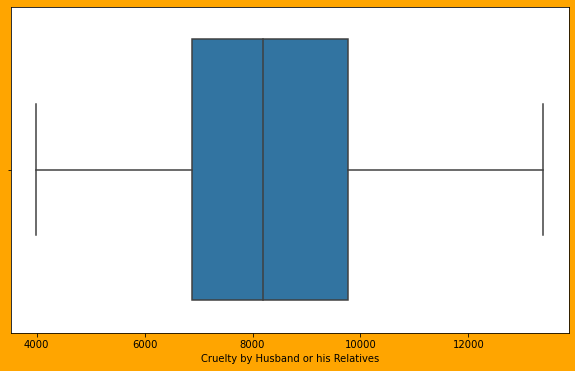

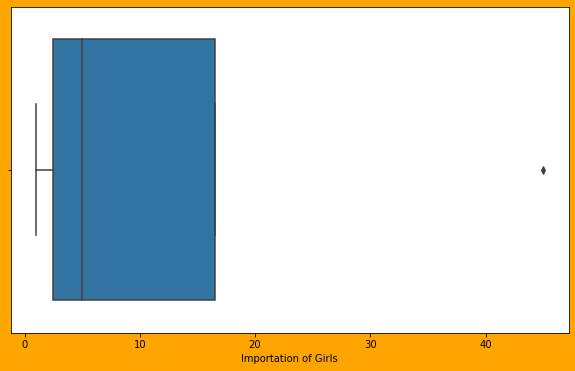

In [104]:
# Boxplots

for i in moderate_area_df.columns[1:-1]:
    plt.figure(figsize=(10,6),facecolor='orange')
    sns.boxplot(moderate_area_df[i])
    plt.xlabel(i)
    plt.show()

# Visualizing peaceful areas:

In [21]:
peaceful_area_df = df[df['cluster_name'] == 'Peaceful Area']

peaceful_area_df.drop(columns=['TOTAL - Dacoity','TOTAL - Robbery','TOTAL - Burglary','TOTAL - Theft','TOTAL IPC CRIMES','Total for boys all Age Groups','Total for girls all Age Groups','Grand total','2001','2011','Per month increase in literacy','literacy in 2002',
'literacy in 2003','literacy in 2004','literacy in 2005',
'literacy in 2006','literacy in 2007',
'literacy in 2008','literacy in 2009',
'literacy in 2010','literacy in 2012',
'Total_crimes','cluster','Rape_y.1'],axis=1,inplace=True)

peaceful_area_df

,State/UT,Population,Area (km2),MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,KIDNAPPING AND ABDUCTION OF OTHERS,DACOITY,PREPARATION AND ASSEMBLY FOR DACOITY,ROBBERY,BURGLARY,THEFT,AUTO THEFT,OTHER THEFT,RIOTS,CRIMINAL BREACH OF TRUST,CHEATING,COUNTERFIETING,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,Murder_x,Rape_x,Kidnapping and Abduction_x,Dacoity_x,Robbery_x,Arson_x,Hurt_x,Prevention of atrocities (POA) Act_x,Protection of Civil Rights (PCR) Act_x,Other Crimes Against SCs,Murder_y,Rape_y,Kidnapping Abduction,Dacoity_y,Robbery_y,Arson_y,Hurt_y,Protection of Civil Rights (PCR) Act_y,Prevention of atrocities (POA) Act_y,Other Crimes Against STs,Murder,Rape_x.1,Kidnapping and Abduction_y,Foeticide,Abetment of suicide,Exposure and abandonment,Procuration of minor girls,Buying of girls for prostitution,Selling of girls for prostitution,Prohibition of child marriage act,Other Crimes,Total,Boys 7-12 Years,Girls 7-12 Years,Boys 12-16 Years,Girls 12-16 Years,Boys 16-18 Years,Girls 16-18 Years,Cases_Property_Recovered,Cases_Property_Stolen,Value_of_Property_Recovered,Value_of_Property_Stolen,Police_Injured_By_Criminals,Police_Injured_By_Riotous_Mobs,Police_Injured_In_Accidents,Police_Injured_In_Dacoity_OperationsOther_raids,Police_Injured_In_TerroristsExtremists_Operations,Police_Injured_On_Border_Duties,Police_Injured_Total_Policemen,Police_Killed_By_Criminals,Police_Killed_By_Riotous_Mobs,Police_Killed_In_Accidents,Police_Killed_In_Dacoity_OperationsOther_raids,Police_Killed_In_TerroristsExtremists_Operations,Police_Killed_On_Border_Duties,Police_Killed_Total_Policemen,RESIDENTIAL PREMISES - Dacoity,RESIDENTIAL PREMISES - Robbery,RESIDENTIAL PREMISES - Burglary,RESIDENTIAL PREMISES - Theft,HIGHWAYS - Dacoity,HIGHWAYS - Robbery,HIGHWAYS - Burglary,HIGHWAYS - Theft,RIVER and SEA - Dacoity,RIVER and SEA - Robbery,RIVER and SEA - Burglary,RIVER and SEA - Theft,RAILWAYS - Dacoity,RAILWAYS - Robbery,RAILWAYS - Burglary,RAILWAYS - Theft,BANKS - Dacoity,BANKS - Robbery,BANKS - Burglary,BANKS - Theft,COMMERCIAL ESTABLISHMENTS - Dacoity,COMMERCIAL ESTABLISHMENTS - Robbery,COMMERCIAL ESTABLISHMENTS - Burglary,COMMERCIAL ESTABLISHMENTS - Theft,OTHER PLACES - Dacoity,OTHER PLACES - Robbery,OTHER PLACES - Burglary,OTHER PLACES - Theft,Cases_Registered_under_Human_Rights_Violations,Policemen_Chargesheeted,Policemen_Convicted,Kidnapping and Abduction,Dowry Deaths,Assault on women with intent to outrage her modesty,Insult to modesty of Women,Cruelty by Husband or his Relatives,Importation of Girls,cluster_name
0,A&N ISLANDS,380581.00,8249.00,21.00,19.00,4.00,24.00,0.00,24.00,17.00,14.00,4.00,5.00,0.00,14.00,99.00,134.00,22.00,124.00,19.00,12.00,56.00,4.00,15.00,118.00,2.00,31.00,10.00,26.00,0.00,9.00,489.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,1.00,0.00,2.00,17.00,2.00,15.00,12.00,3.00,0.00,2.00,0.00,0.00,0.00,0.00,24.00,51.00,2.00,0.00,16.00,3.00,36.00,9.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.00,68.00,41.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,15.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,15.00,0.00,1.00,19.00,31.00,5.00,12.00,31.00,91.00,0.00,0.00,0.00,14.00,2.00,31.00,10.00,26.00,0.00,Peaceful Area
2,ARUNACHAL PRADESH,1383727.00,83743.00,83.00,53.00,6.00,59.00,0.00,59.00,93.00,60.00,34.00,37.00,2.00,96.00,263.00,531.00,152.00,412.00,65.00,61.00,91.00,10.00,34.00,526.00,1.00,84.00,6.00,26.00,0.00,110.00,717.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,4.00,9.00,10.00,1.00,2.00,2.00,38.00,0.00,0.00,57.00,0.00,20.00,27.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.00,39.00,18.00,1.00,88.00,1.00,100.00,5.00,401.00,949.00,168882335.00,246090

In [22]:
peaceful_area_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Population,20.00,5565645.60,9504671.00,0.00,604373.75,1421136.00,4471588.25,35003674.00
Area (km2),20.00,28487.80,31693.70,0.00,2927.25,18830.00,51142.25,112077.00
MURDER,20.00,179.65,294.45,0.00,21.00,50.50,194.75,1075.00
ATTEMPT TO MURDER,20.00,192.35,389.46,0.00,14.50,43.50,86.25,1474.00
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,20.00,22.40,47.86,0.00,3.50,8.00,16.25,216.00
RAPE,20.00,107.20,160.28,0.00,13.75,44.50,152.00,680.00
CUSTODIAL RAPE,20.00,0.10,0.31,0.00,0.00,0.00,0.00,1.00
OTHER RAPE,20.00,107.15,160.10,0.00,13.75,44.50,152.00,679.00
KIDNAPPING & ABDUCTION,20.00,168.95,300.55,0.00,13.75,44.00,168.50,1093.00
KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,20.00,136.45,266.09,0.00,8.25,28.00,120.25,1041.00


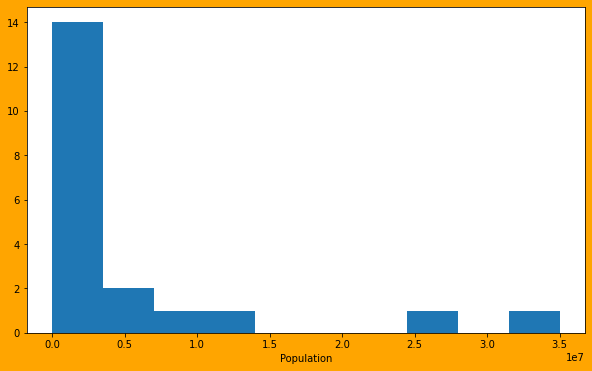

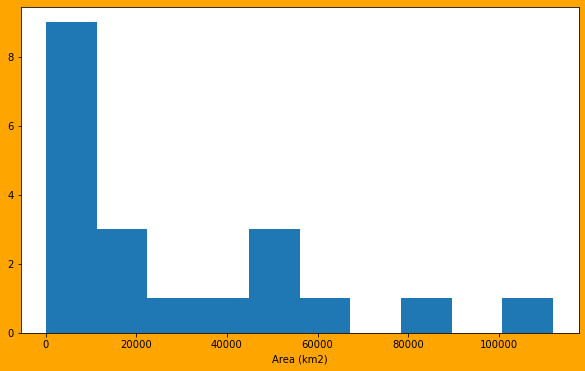

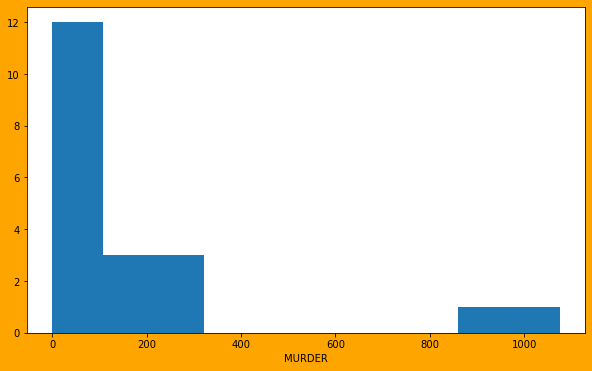

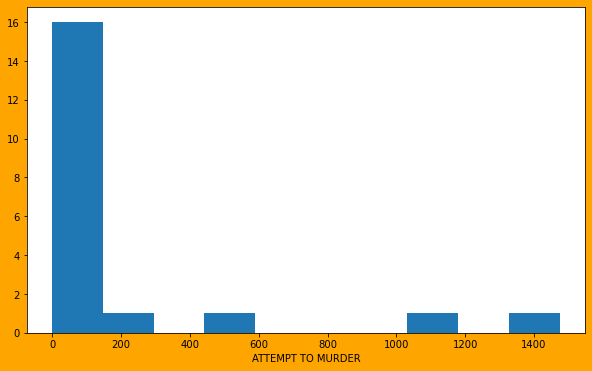

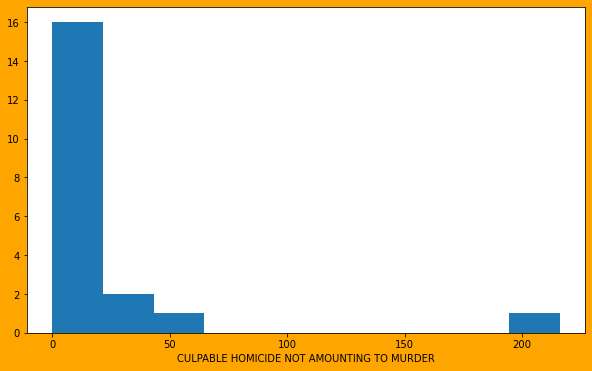

...

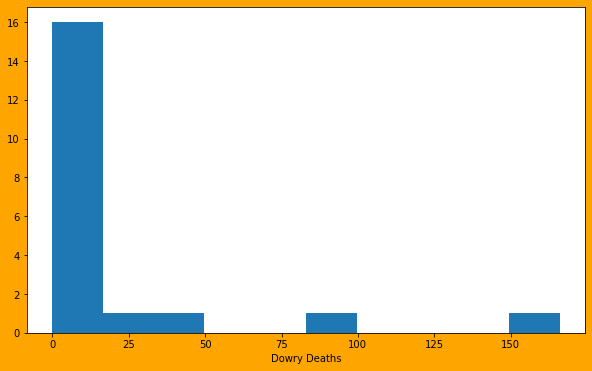

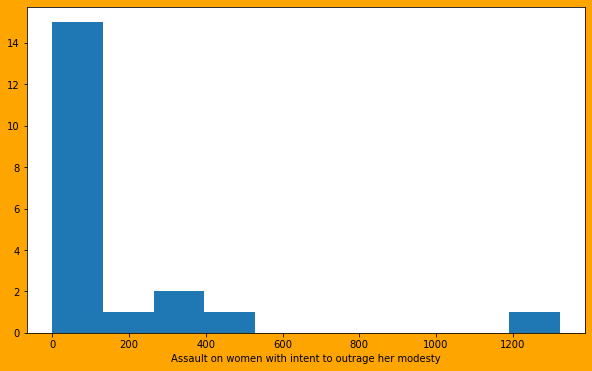

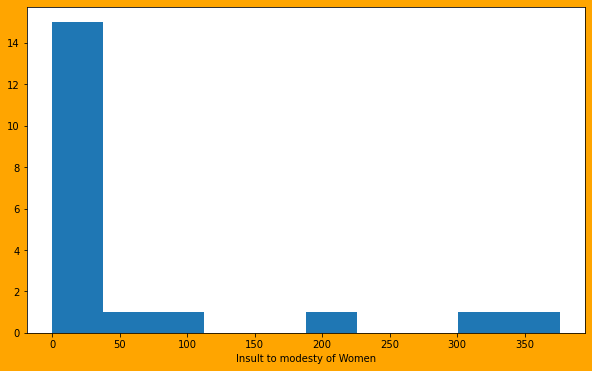

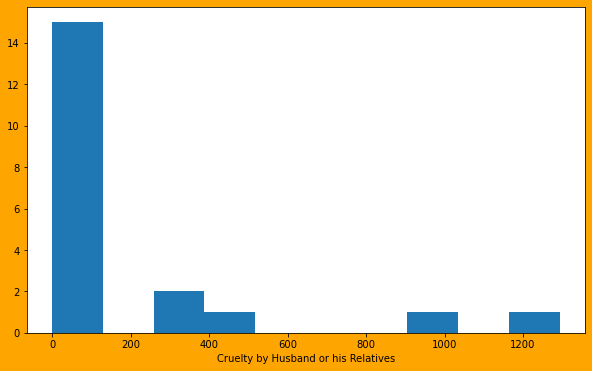

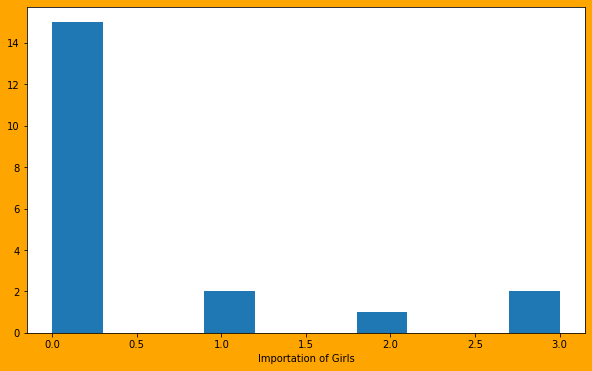

In [107]:
# Histogram plot:

for i in peaceful_area_df.columns[1:-1]:
    plt.figure(figsize=(10,6),facecolor='orange')
    plt.hist(peaceful_area_df[i],bins=10)
    plt.xlabel(i)
    plt.show()
    print('\n')

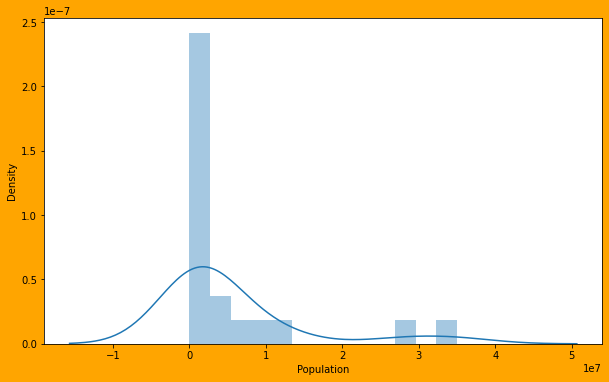

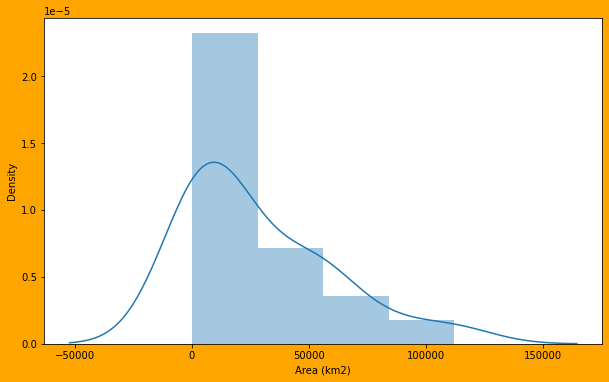

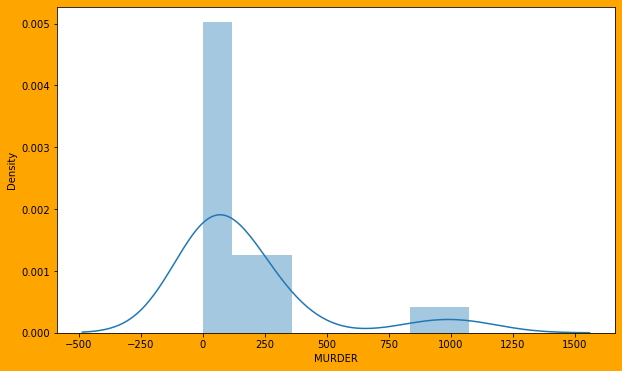

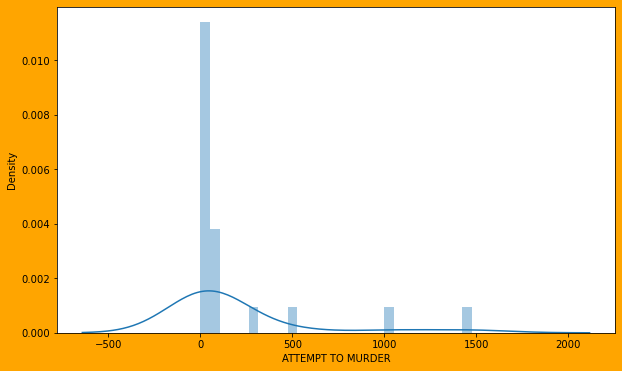

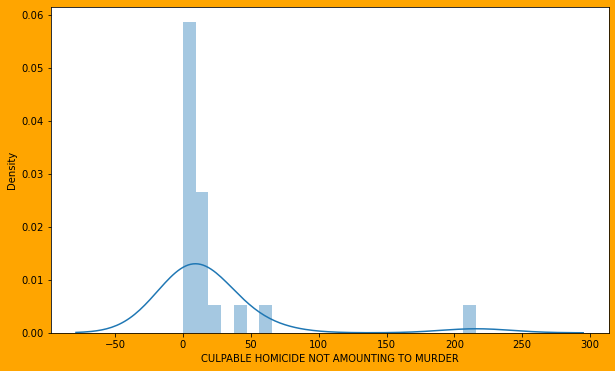

...

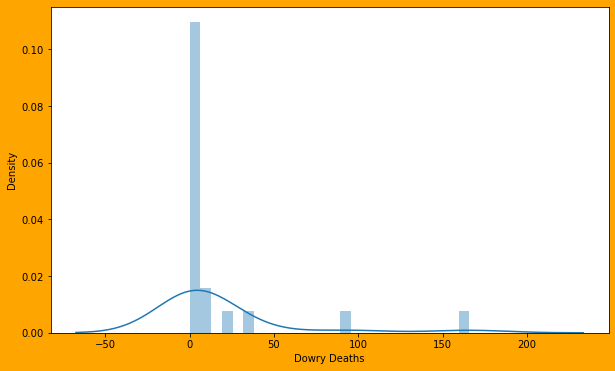

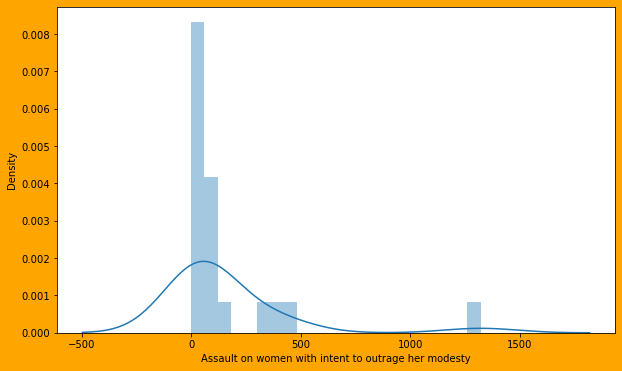

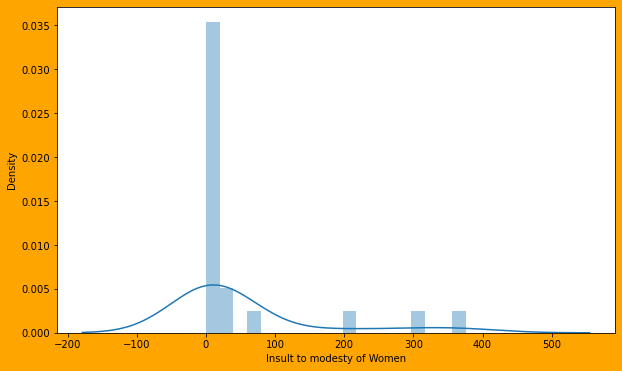

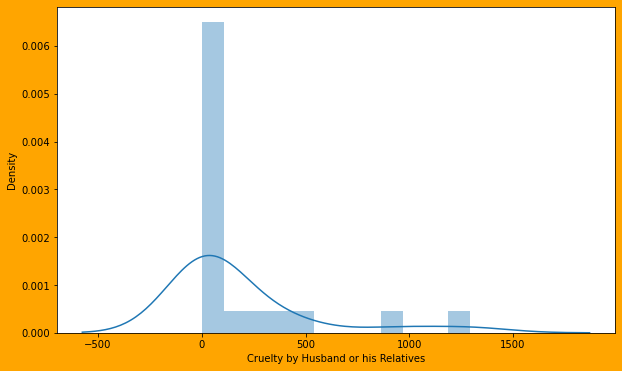

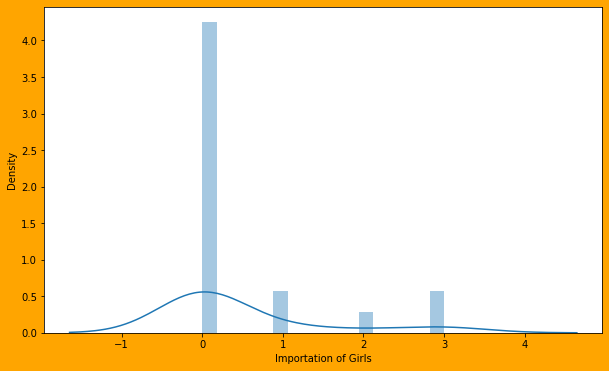

In [108]:
# Densityplot

for i in peaceful_area_df.columns[1:-1]:
    plt.figure(figsize=(10,6),facecolor='orange')
    sns.distplot(peaceful_area_df[i])
    plt.xlabel(i)
    plt.show()

In [ ]:
# Boxplots

for i in peaceful_area_df.columns[1:-1]:
    plt.figure(figsize=(10,6),facecolor='orange')
    sns.boxplot(peaceful_area_df[i])
    plt.xlabel(i)
    plt.show()

# Most safe and unsafe districts:

In [47]:
# storing file locations in variables

file1 = r'E:\DS Course Related\Capstone Project\India_Crime - Copy\01_District_wise_crimes_committed_IPC_2001_2012.csv'
file2 = r'E:\DS Course Related\Capstone Project\India_Crime - Copy\02_01_District_wise_crimes_committed_against_SC_2001_2012.csv'
file3 = r'E:\DS Course Related\Capstone Project\India_Crime - Copy\02_District_wise_crimes_committed_against_ST_2001_2012.csv'
file4 = r'E:\DS Course Related\Capstone Project\India_Crime - Copy\03_District_wise_crimes_committed_against_children_2001_2012.csv'
file5 = r'E:\DS Course Related\Capstone Project\India_Crime - Copy\08_01_Juvenile_apprehended_state_IPC_2001_2010.csv'
file6 = r'E:\DS Course Related\Capstone Project\India_Crime - Copy\11_Property_stolen_and_recovered_nature_of_property_2001_2010.csv'
file7 = r'E:\DS Course Related\Capstone Project\India_Crime - Copy\13_Police_killed_or_injured_on_duty2001_2010.csv'
file8 = r'E:\DS Course Related\Capstone Project\India_Crime - Copy\17_Case_reported_and_value_of_property_taken_away_by_place_of_occurrence_2001_2012.csv'
file9 = r'E:\DS Course Related\Capstone Project\India_Crime - Copy\17_Crime_by_place_of_occurrence_2001_2012.csv'
file10 = r'E:\DS Course Related\Capstone Project\India_Crime - Copy\35_Human_rights_violation_by_police_2001_2010.csv'
file11 = r'E:\DS Course Related\Capstone Project\India_Crime - Copy\42_District_wise_crimes_committed_against_women_2001_2012.csv'

# reading datasets

df1_ipc = pd.read_csv(file1)
df2_sc = pd.read_csv(file2)
df3_st  =pd.read_csv(file3)
df4_child = pd.read_csv(file4)
df5_juv = pd.read_csv(file5)
df6_prop_stolen = pd.read_csv(file6)
df7_police = pd.read_csv(file7)
df8_propval = pd.read_csv(file8)
df9_place = pd.read_csv(file9)
df10_hrvio = pd.read_csv(file10)
df11_women = pd.read_csv(file11)

df_list = [df1_ipc,df2_sc,df3_st,df4_child,df5_juv,df6_prop_stolen,df7_police,df8_propval,df9_place,df10_hrvio,df11_women]

In [48]:
analysis_of_districts = []

merged_df = pd.merge(df1_ipc, df2_sc, on='DISTRICT')
"""merged_df = pd.merge(merged_df, df3_st, on='DISTRICT')
merged_df = pd.merge(merged_df, df4_child, on='DISTRICT')"""

merged_df.columns

Index(['STATE/UT_x', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES',
       'STATE/UT_y', 'Year', 'Murder', 'Rape', 'Kidnapping and Abduction',
       'Dacoity', 'Robbery', 'Arson', 'Hurt',
       'Prevention of atrocities (POA) Act',
       'Protection of

In [29]:
merged_df.drop(columns = ['YEAR','STATE/UT_y', 'Year','TOTAL IPC CRIMES',],axis=1,inplace=True)

In [36]:
merged_df

,STATE/UT_x,DISTRICT,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,...,Murder,Rape,Kidnapping and Abduction,Dacoity,Robbery,Arson,Hurt,Prevention of atrocities (POA) Act,Protection of Civil Rights (PCR) Act,Other Crimes Against SCs
0,ANDHRA PRADESH,ADILABAD,101,60,17,50,0,50,46,30,...,0,1,4,0,0,0,3,0,15,32
1,ANDHRA PRADESH,ADILABAD,101,60,17,50,0,50,46,30,...,0,2,0,0,0,0,2,0,16,18
2,ANDHRA PRADESH,ADILABAD,101,60,17,50,0,50,46,30,...,0,1,0,0,0,0,1,12,0,12
3,ANDHRA PRADESH,ADILABAD,101,60,17,50,0,50,46,30,...,0,4,0,0,0,0,3,14,3,25
4,ANDHRA PRADESH,ADILABAD,101,60,17,50,0,50,46,30,...,0,5,0,0,0,0,6,26,0,37
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
276728,WEST BENGAL,BDN CP,15,35,4,13,0,13,53,0,...,0,0,0,0,0,0,1,0,0,1
276729,WEST BENGAL,BKP CP,89,49,18,36,0,36,214,201,...,0,0,0,0,0,0,0,0,0,0
276730,WEST BENGAL,JHARGRAM,30,23,5,21,0,21,21,21,...,0,0,0,0,0,0,0,0,0,0
276731,WEST BENGAL,SILIGURI_PC,32,6,6,21,0,21,123,111,...,0,0,0,0,0,0,0,0,0,0


In [30]:
district_analysis = merged_df.T
district_analysis.columns = merged_df['DISTRICT']
district_analysis

DISTRICT,ADILABAD,ADILABAD,ADILABAD,ADILABAD,ADILABAD,ADILABAD,ADILABAD,ADILABAD,ADILABAD,ADILABAD,...,JODHPUR WEST,GOMATI,KHOWAI,SIPAHIJALA,UNAKOTI,BDN CP,BKP CP,JHARGRAM,SILIGURI_PC,CAR
STATE/UT_x,ANDHRA PRADESH,ANDHRA PRADESH,ANDHRA PRADESH,ANDHRA PRADESH,ANDHRA PRADESH,ANDHRA PRADESH,ANDHRA PRADESH,ANDHRA PRADESH,ANDHRA PRADESH,ANDHRA PRADESH,...,RAJASTHAN,TRIPURA,TRIPURA,TRIPURA,TRIPURA,WEST BENGAL,WEST BENGAL,WEST BENGAL,WEST BENGAL,A & N ISLANDS
DISTRICT,ADILABAD,ADILABAD,ADILABAD,ADILABAD,ADILABAD,ADILABAD,ADILABAD,ADILABAD,ADILABAD,ADILABAD,...,JODHPUR WEST,GOMATI,KHOWAI,SIPAHIJALA,UNAKOTI,BDN CP,BKP CP,JHARGRAM,SILIGURI_PC,CAR
MURDER,101,101,101,101,101,101,101,101,101,101,...,15,18,12,12,9,15,89,30,32,2
ATTEMPT TO MURDER,60,60,60,60,60,60,60,60,60,60,...,42,8,4,9,8,35,49,23,6,0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,17,17,17,17,17,17,17,17,17,17,...,3,0,0,0,1,4,18,5,6,0
RAPE,50,50,50,50,50,50,50,50,50,50,...,20,26,10,23,26,13,36,21,21,0
CUSTODIAL RAPE,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
OTHER RAPE,50,50,50,50,50,50,50,50,50,50,...,20,26,10,23,26,13,36,21,21,0
KIDNAPPING & ABDUCTION,46,46,46,46,46,46,46,46,46,46,...,29,16,5,29,10,53,214,21,123,1
KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,30,30,30,30,30,30,30,30,30,30,...,23,14,3,24,9,0,201,21,111,1


In [51]:
district_analysis_transposed = district_analysis.T
district_analysis_transposed

,STATE/UT_x,DISTRICT,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,...,Murder,Rape,Kidnapping and Abduction,Dacoity,Robbery,Arson,Hurt,Prevention of atrocities (POA) Act,Protection of Civil Rights (PCR) Act,Other Crimes Against SCs
DISTRICT,,,,,,,,,,,,,,,,,,,,,
ADILABAD,ANDHRA PRADESH,ADILABAD,101,60,17,50,0,50,46,30,...,0,1,4,0,0,0,3,0,15,32
ADILABAD,ANDHRA PRADESH,ADILABAD,101,60,17,50,0,50,46,30,...,0,2,0,0,0,0,2,0,16,18
ADILABAD,ANDHRA PRADESH,ADILABAD,101,60,17,50,0,50,46,30,...,0,1,0,0,0,0,1,12,0,12
ADILABAD,ANDHRA PRADESH,ADILABAD,101,60,17,50,0,50,46,30,...,0,4,0,0,0,0,3,14,3,25
ADILABAD,ANDHRA PRADESH,ADILABAD,101,60,17,50,0,50,46,30,...,0,5,0,0,0,0,6,26,0,37
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BDN CP,WEST BENGAL,BDN CP,15,35,4,13,0,13,53,0,...,0,0,0,0,0,0,1,0,0,1
BKP CP,WEST BENGAL,BKP CP,89,49,18,36,0,36,214,201,...,0,0,0,0,0,0,0,0,0,0
JHARGRAM,WEST BENGAL,JHARGRAM,30,23,5,21,0,21,21,21,...,0,0,0,0,0,0,0,0,0,0


In [53]:
crimes = district_analysis_transposed.columns[2:]
crimes

Index(['MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'Murder', 'Rape',
       'Kidnapping and Abduction', 'Dacoity', 'Robbery', 'Arson', 'Hurt',
       'Prevention of atrocities (POA) Act',
       'Protection of Civil Rights (PCR) Act', 'Other Crimes Against SCs'],
      dtype='object')

In [56]:
for i in crimes:
    print('For crime: ',i)
    print(district_analysis_transposed.sort_values(by=i,ascending=False))
    print('\n\n')

For crime:  MURDER
             STATE/UT_x DISTRICT MURDER ATTEMPT TO MURDER  \
DISTRICT                                                    
TOTAL     UTTAR PRADESH    TOTAL   7601              7964   
TOTAL     UTTAR PRADESH    TOTAL   7601              7964   
TOTAL     UTTAR PRADESH    TOTAL   7601              7964   
TOTAL     UTTAR PRADESH    TOTAL   7601              7964   
TOTAL     UTTAR PRADESH    TOTAL   7601              7964   
...                 ...      ...    ...               ...   
TOTAL       LAKSHADWEEP    TOTAL      0                 0   
TOTAL       LAKSHADWEEP    TOTAL      0                 0   
TOTAL       LAKSHADWEEP    TOTAL      0                 0   
TOTAL       LAKSHADWEEP    TOTAL      0                 0   
TOTAL       LAKSHADWEEP    TOTAL      0                 0   

         CULPABLE HOMICIDE NOT AMOUNTING TO MURDER  RAPE CUSTODIAL RAPE  \
DISTRICT                                                                  
TOTAL                                